# Air Routes Map

## Introduction

This Notebook is a re-implenentation of some of the maps relating to global air traffic, based upon the book Python Maps
Geospatial Visualization with Python, 
by Adam Symington [https://locatepress.com/book/pymaps]

I found the book excellent.  I was already familiar with GeoPandas, but the book covers other packages, such as `rasterio`.  An interesting approach in the book is to stress the `Shapely` package that underlies GeoPandas. For example, in  mapping airport locations, the book chooses the use the Shapely `Point` object to explicitly build a geometry of (Longitude, Latitude) points, rather than the `geopandas.points_from_xy` method

The source of the data I used is from a a Github repository, andf it seems to be up-to-date

https://github.com/Jonty/airline-route-data/blob/main/README.md

--------------------------
## Implementation
### Notebook magic commands

- watermark provides reproducability information
- lab_black formats cells automatically

In [1]:
%matplotlib inline

In [2]:
%load_ext watermark

In [3]:
%load_ext lab_black

### Notebook imports

In [4]:
# all imports should go here

import pandas as pd

import geopandas as gpd
import geodatasets as gds

import shapely.geometry as sg

import cartopy
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

import json

## Data load

Load airport and routes data, as JSON file

In [5]:
ROUTES_URL = (
    "C:\\Data\\PythonMaps\\AirRoutes\\airline_routes.json"
)

with open(ROUTES_URL) as f:
    d = json.load(f)
# end with

Check count of entries (seems ok)

In [6]:
len(d.keys())

3770

Check layout of data - for every airport, we have data associated with the airport, and zero or more routes flown to other airports.

In [7]:
d['AAA']

{'city_name': 'Anaa',
 'continent': 'OC',
 'country': 'French Polynesia',
 'country_code': 'PF',
 'display_name': 'Anaa (AAA), French Polynesia',
 'elevation': 23,
 'iata': 'AAA',
 'icao': 'NTGA',
 'latitude': '-17.355648',
 'longitude': '-145.50913',
 'name': 'Anaa Airport',
 'routes': [{'carriers': [{'iata': 'VT', 'name': 'Air Tahiti'}],
   'iata': 'FAC',
   'km': 76,
   'min': 20},
  {'carriers': [{'iata': 'VT', 'name': 'Air Tahiti'}],
   'iata': 'MKP',
   'km': 215,
   'min': 40}],
 'timezone': 'Pacific/Tahiti'}

---------------------------
## Data analysis
### Airports

We build a data structure ( a set) for each airport with a valid location, holding items of interest in a dict.

In [8]:
# build lat lon dict for IATA code as key, where location is known

airports_location = {
    d[k]['iata']: {
        'latitude': float(d[k]['latitude']),
        'longitude': float(d[k]['longitude']),
        'continent': d[k]['continent'],
    }
    for k in d.keys()
    if d[k]['latitude'] != None
}

In [9]:
# check an entry in our data structure
airports_location['AAA']

{'latitude': -17.355648, 'longitude': -145.50913, 'continent': 'OC'}

### Routes

For the first few airports, display the first few routes, showing origin and destination cofdes and lat/lon values

In [10]:
# get first few airports
for key in list(d.keys())[0:5]:
    # get airport dict
    airport = d[key]
    # print iata name for airport
    print(f"Airport Code {airport['iata']} has routes to:")

    # for few routes from airport, show:
    #   origin (this airport), and origin lat lon
    #   destination, and destination lat, Lon

    for route in airport['routes'][:4]:

        print(
            f"{airport['iata']}"
            f" ({float(airport['latitude']):5.1f}, "
            f"{float(airport['longitude']):5.1f}) -> "
            f"{route['iata']}"
            f" ({airports_location[route['iata']]['latitude']:5.1f}, "
            f" {airports_location[route['iata']]['longitude']:5.1f})"
        )
    # end for

# end for

Airport Code AAA has routes to:
AAA (-17.4, -145.5) -> FAC (-16.7,  -145.3)
AAA (-17.4, -145.5) -> MKP (-16.6,  -143.7)
Airport Code AAD has routes to:
AAD (  6.1,  46.6) -> MGQ (  2.0,   45.3)
Airport Code AAE has routes to:
AAE ( 36.8,   7.8) -> ALG ( 36.7,    3.2)
AAE ( 36.8,   7.8) -> MRS ( 43.4,    5.2)
AAE ( 36.8,   7.8) -> CDG ( 49.0,    2.6)
AAE ( 36.8,   7.8) -> ORY ( 48.7,    2.4)
Airport Code AAK has routes to:
AAK (  0.2, 173.6) -> TRW (  1.4,  173.1)
Airport Code AAL has routes to:
AAL ( 57.1,   9.9) -> CPH ( 55.6,   12.6)
AAL ( 57.1,   9.9) -> AMS ( 52.3,    4.8)
AAL ( 57.1,   9.9) -> OSL ( 60.2,   11.1)
AAL ( 57.1,   9.9) -> AGP ( 36.7,   -4.5)


-----------------------
## Mapping

### Mapping airports

We use Shapely to build the geometry for airport locations, and then create a Geopandas GeoDataFrame

In [11]:
airports_points = [
    sg.Point(
        airports_location[k]['longitude'],
        airports_location[k]['latitude'],
    )
    for k in airports_location.keys()
]

continents = [
    airports_location[a]['continent']
    for a in airports_location.keys()
]
airports = gpd.GeoDataFrame(
    data={
        'name': airports_location.keys(),
        'continent': continents,
    },
    geometry=airports_points,
)

Check first few rows of GeoDataFrame

In [12]:
airports.head(4)

,name,continent,geometry
0,AAA,OC,POINT (-145.50913 -17.35565)
1,AAD,AF,POINT (46.6375 6.09583)
2,AAE,AF,POINT (7.81186 36.82139)
3,AAK,OC,POINT (173.58333 0.16667)


Perform a quick-and-easy plot to check geometry (look O)

<Axes: >

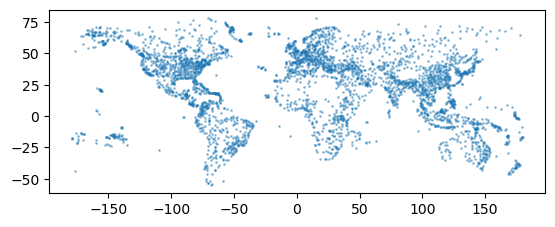

In [13]:
airports.plot(
    markersize=1,
    alpha=0.4,
)

Just for fun, plot the airports, colored by continent

<Axes: >

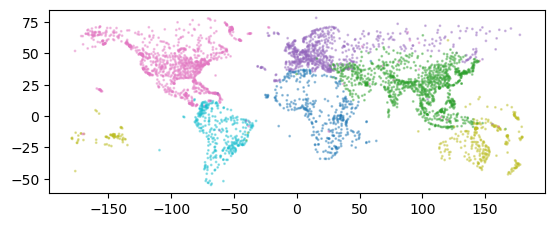

In [14]:
airports.plot(
    markersize=1,
    alpha=0.4,
    column='continent',
)

Count the airports by continent

In [15]:
airports['continent'].value_counts()

continent
NA    1029
AS    1014
EU     681
AF     356
OC     335
SA     326
Name: count, dtype: int64

### Mapping routes between airports

Create a data structure to hold all routes between airports.  We use `Shapely` `LineString` to hold a->b lines

In [16]:
# get airports
# lists below will hold key variables of a route from an origin,
# to a destination
# list to hold geometric two-point line
from_to_geo = []

# list to hold names of origin of route
from_name = []
# list to hold names of destination of route
to_name = []

# list of route distances
distance = []

# run through all airports
for key in list(d.keys()):
    # get airport dict
    airport = d[key]

    # for routes from this airport to another one
    for route in airport['routes']:

        from_name.append(airport['iata'])
        to_name.append(route['iata'])

        from_lat = float(airport['latitude'])
        from_lon = float(airport['longitude'])

        to_lat = airports_location[route['iata']][
            'latitude'
        ]
        to_lon = airports_location[route['iata']][
            'longitude'
        ]

        from_to_ls = sg.LineString(
            [[from_lon, from_lat], [to_lon, to_lat]]
        )
        from_to_geo.append(from_to_ls)

        distance.append(route['km'])

    # end for

# end for

Build routes GeoDataFrame, and view first few rows

In [17]:
air_routes = gpd.GeoDataFrame(
    data={
        'from_name': from_name,
        'to_name': to_name,
        'distance': distance,
    },
    geometry=from_to_geo,
)

In [18]:
air_routes.head(4)

,from_name,to_name,distance,geometry
0,AAA,FAC,76,"LINESTRING (-145.50913 -17.35565, -145.33257 -..."
1,AAA,MKP,215,"LINESTRING (-145.50913 -17.35565, -143.65436 -..."
2,AAD,MGQ,474,"LINESTRING (46.6375 6.09583, 45.31333 2.01333)"
3,AAE,ALG,411,"LINESTRING (7.81186 36.82139, 3.20714 36.69789)"


Do a quick-and-easy plot, to check data.  Some air routes are not correctly crossing the Pacific, but that is OK (we will fix that in the Cartopy mapping section)

<Axes: >

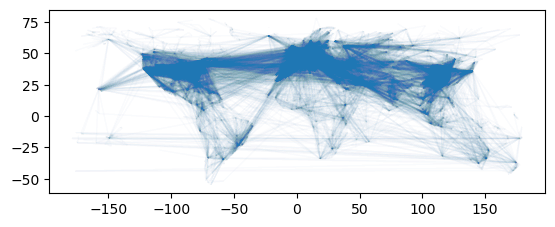

In [19]:
air_routes.plot(
    linewidth=1,
    alpha=0.01,
)

Show a larger version of the same plot, to get a better sense of the data

<Axes: >

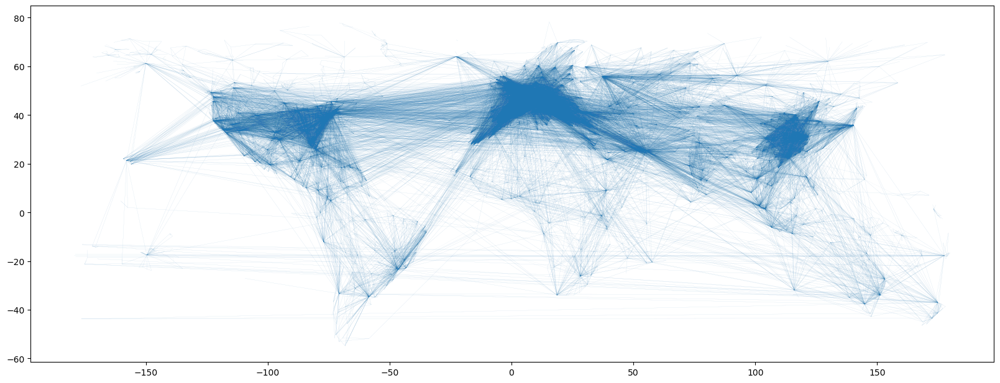

In [20]:
fig, ax = plt.subplots(
    figsize=(20, 20),
)

air_routes.plot(
    linewidth=0.1,
    alpha=0.2,
    ax=ax,
)

-------------------
## Better (globe-aware) route plotting
### Cartopy and Robinson projection

We start by a tailored map (rather than the GeoPandas default plot)

We use the Robinson projection, that was *"created in an attempt to find a good compromise to the problem of readily showing the whole globe as a flat image"*

The use of the `projection` keyword triggers Cartopy functionality, and the `transform=ccrs.Geodetic()` parameter means we get Great Circles joing our two end points of each route.


<GeoAxes: >

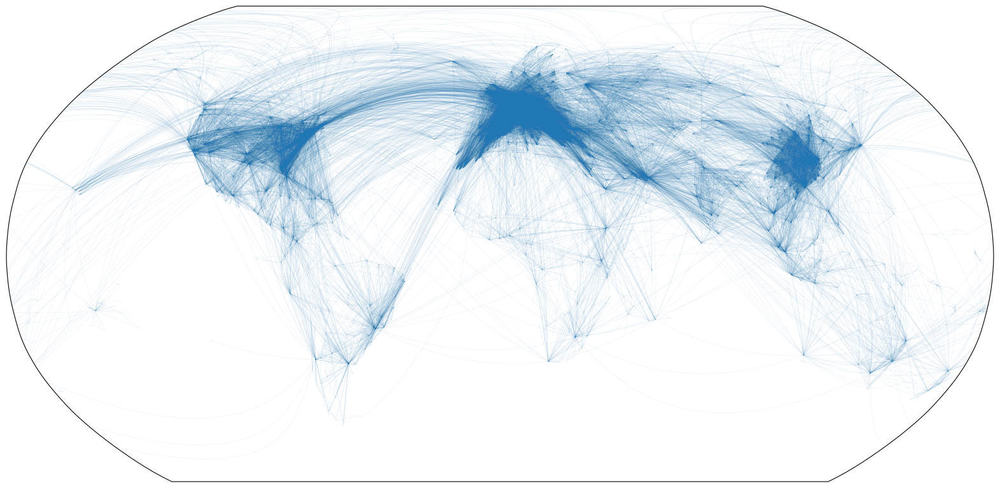

In [21]:
fig, ax = plt.subplots(
    figsize=(20, 20),
    subplot_kw={'projection': ccrs.Robinson()},
)

air_routes.plot(
    linewidth=0.1,
    alpha=0.2,
    ax=ax,
    transform=ccrs.Geodetic(),
)

### Cartopy and coastlines

Next we try a different projection, one that is equal area.  We use the coastlines built-in to Cartopy.

<GeoAxes: >

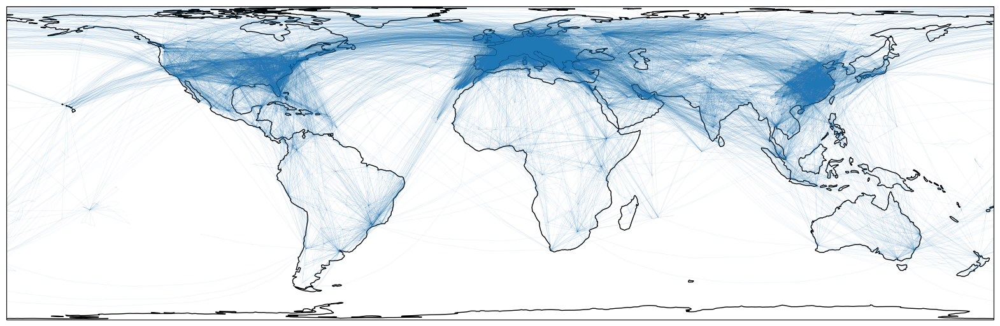

In [22]:
fig, ax = plt.subplots(
    figsize=(20, 20),
    subplot_kw={'projection': ccrs.LambertCylindrical()},
)
ax.coastlines(resolution='110m')

air_routes.plot(
    linewidth=0.1,
    alpha=0.2,
    ax=ax,
    transform=ccrs.Geodetic(),
)

### Zoom to Europe

We zoom into Europe, and dim the coastlines.  I feel that this view show how little the African continent participates in global travel.

<GeoAxes: >

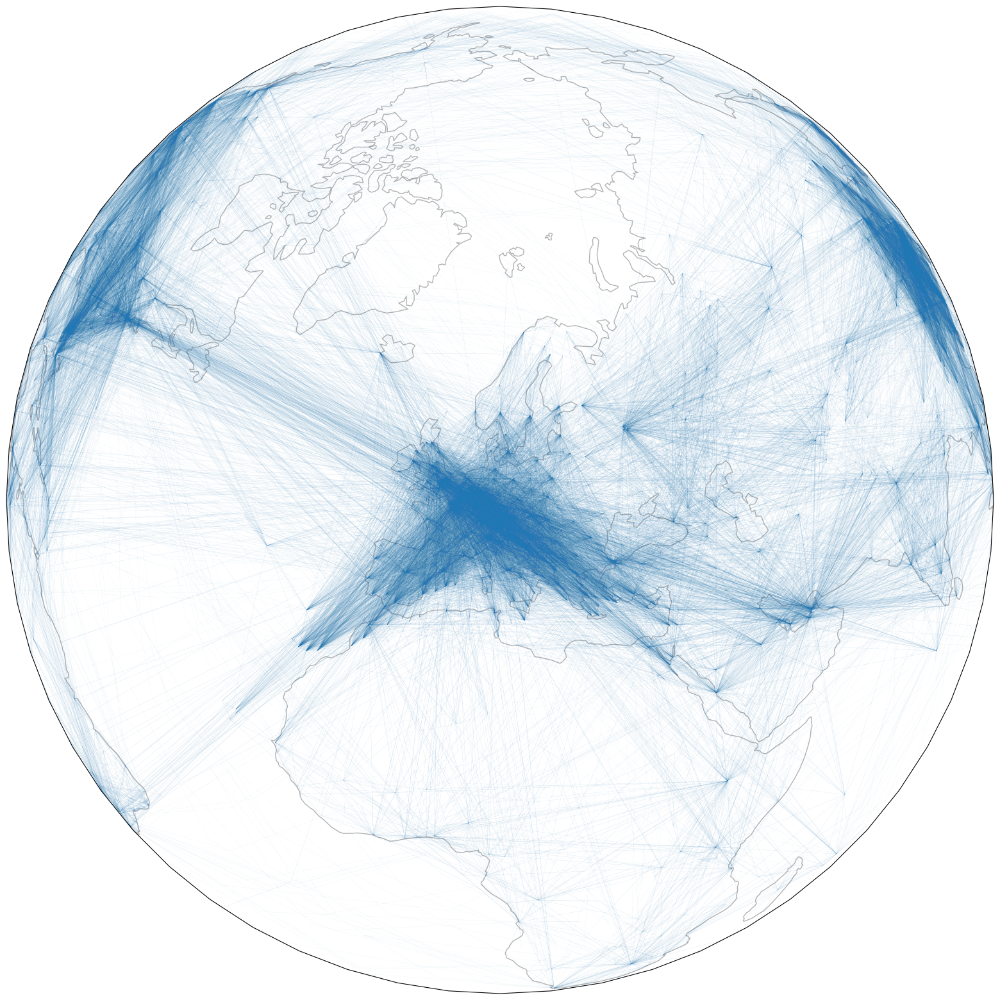

In [23]:
fig, ax = plt.subplots(
    figsize=(20, 20),
    subplot_kw={
        'projection': ccrs.Orthographic(
            central_longitude=11,
            central_latitude=50,
        )
    },
)
ax.coastlines(
    resolution='110m',
    alpha=0.6,
    color='gray',
)

air_routes.plot(
    linewidth=0.1,
    alpha=0.2,
    ax=ax,
    transform=ccrs.Geodetic(),
)

### Long distance routes

Finally, emphasise the long distance flights.  We use a color map that sets the longest route to black, and the shortest to white.  We do the same to `alpha` (alpha=1 for longest route, getting smaller for shorter routes), to further dim the shorter flights.

<GeoAxes: >

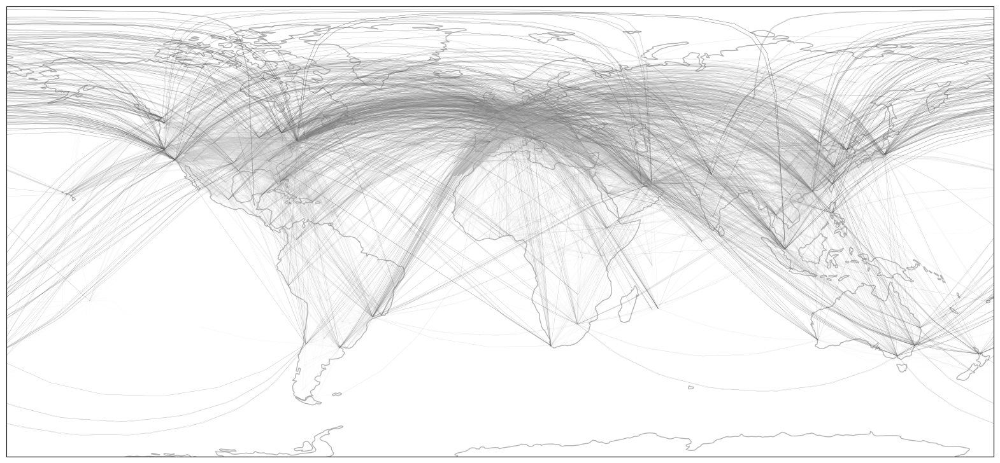

In [24]:
fig, ax = plt.subplots(
    figsize=(20, 20),
    subplot_kw={'projection': ccrs.PlateCarree()},
)

ax.coastlines(
    resolution='110m',
    alpha=0.6,
    color='gray',
)

air_routes.plot(
    linewidth=0.1,
    alpha=air_routes['distance']
    / air_routes['distance'].max(),
    column='distance',
    cmap='binary',
    ax=ax,
    transform=ccrs.Geodetic(),
)

Another approach to see Australia and the whole world.  This view distorts Africa and South America, but they have the fewest flights.  I feel it shows best the structure of Oceania, North America, and Asia traffic, at the cost of blurring the traffic to and from Europe.

<GeoAxes: >

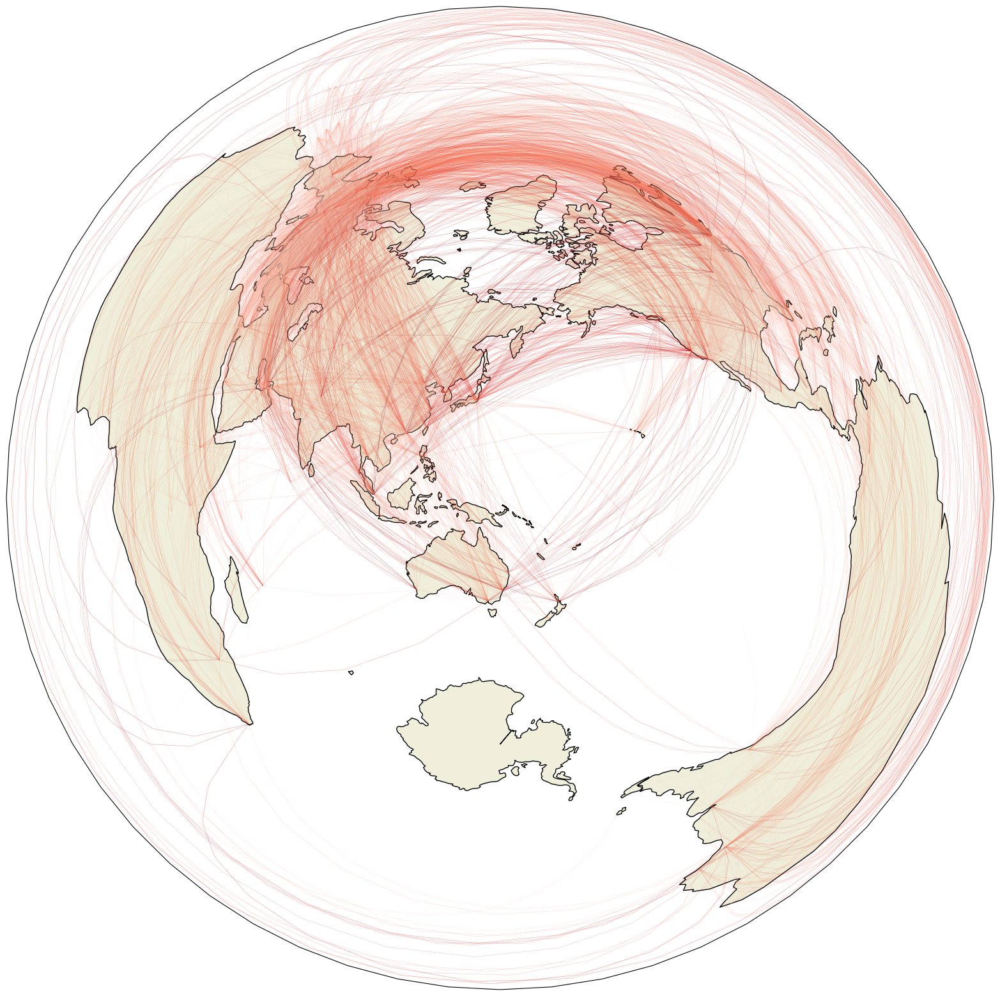

In [25]:
fig, ax = plt.subplots(
    figsize=(20, 20),
    subplot_kw={
        'projection': ccrs.AzimuthalEquidistant(
            central_longitude=150
        )
    },
)


ax.add_feature(
    cartopy.feature.LAND, zorder=0, edgecolor='black'
)

air_routes.plot(
    linewidth=0.1,
    alpha=air_routes['distance']
    / air_routes['distance'].max(),
    column='distance',
    cmap='Reds',
    ax=ax,
    transform=ccrs.Geodetic(),
)

-------------------
## Reproducibility

### Notebook version status

In [26]:
%watermark

Last updated: 2025-05-10T15:32:42.672893+10:00

Python implementation: CPython
Python version       : 3.12.9
IPython version      : 9.0.2

Compiler    : MSC v.1929 64 bit (AMD64)
OS          : Windows
Release     : 11
Machine     : AMD64
Processor   : Intel64 Family 6 Model 170 Stepping 4, GenuineIntel
CPU cores   : 22
Architecture: 64bit



In [27]:
%watermark -co  -iv -v -h

Python implementation: CPython
Python version       : 3.12.9
IPython version      : 9.0.2

conda environment: pythonmaps

Hostname: INSPIRON16

matplotlib : 3.10.0
cartopy    : 0.24.1
geodatasets: 2024.8.0
geopandas  : 1.0.1
pandas     : 2.2.3
json       : 2.0.9
shapely    : 2.0.6

